In [3]:
from PyPDF2 import PdfReader
from langchain.text_splitter import RecursiveCharacterTextSplitter

reader = PdfReader("chapter.pdf")
text = " ".join([page.extract_text() for page in reader.pages])

# Split into semantic chunks
text_splitter = RecursiveCharacterTextSplitter(
    chunk_size=500,
    chunk_overlap=100
)
chunks = text_splitter.split_text(text)


In [5]:
from sentence_transformers import SentenceTransformer
import faiss
import numpy as np

model = SentenceTransformer("all-MiniLM-L6-v2")  # light & fast

embeddings = model.encode(chunks, show_progress_bar=True)

# Build FAISS index
dimension = embeddings[0].shape[0]
index = faiss.IndexFlatL2(dimension)
index.add(np.array(embeddings))


Batches: 100%|████████████████████████████████████| 5/5 [00:02<00:00,  2.20it/s]


In [6]:
query = " Explain how the global transfer of disease in the pre-modern world helped in the colonisation of the Americas."
query_embedding = model.encode([query])
_, top_k_indices = index.search(np.array(query_embedding), k=5)

retrieved_chunks = [chunks[i] for i in top_k_indices[0]]
context = "\n".join(retrieved_chunks)


In [9]:
from openai import OpenAI

client = OpenAI(
    api_key="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",
    base_url="https://api.groq.com/openai/v1"
)

response = client.chat.completions.create(
    model="llama3-8b-8192",
    messages=[
        {"role": "system", "content": "You are a helpful assistant."},
        {"role": "user", "content": f"Answer based on context:\n\n{context}\n\nQ: {query}"}
    ]
)

print(response.choices[0].message.content)


The global transfer of disease played a crucial role in the colonization of the Americas. The Spanish conquerors brought with them diseases such as smallpox, to which the indigenous inhabitants of the Americas had no immunity. These diseases spread rapidly and devastated the native populations, making it easier for the Spanish to conquer and colonize the region.

Smallpox, in particular, was a deadly disease that spread quickly and killed many people. The disease had been present in Europe for centuries, but the indigenous populations of the Americas had not been exposed to it before. As a result, they had no immunity to the disease and were highly susceptible to its effects.

The rapid spread of smallpox and other diseases caused by European contact had a significant impact on the native populations of the Americas. Many people died from the diseases, and the populations of the regions were decimated. This made it easier for the Spanish and other European colonizers to establish thems

Bonus
For Groq KV caching is automatically enabled.

In [11]:
import stanza
stanza.download('en')


2025-05-24 19:37:17 INFO: Downloaded file to /Users/anantasati/stanza_resources/resources.json
2025-05-24 19:37:17 INFO: Downloading default packages for language: en (English) ...
2025-05-24 19:38:50 INFO: Downloaded file to /Users/anantasati/stanza_resources/en/default.zip
2025-05-24 19:38:52 INFO: Finished downloading models and saved to /Users/anantasati/stanza_resources


Trying with a example

In [13]:
# Load the full pipeline with required processors
nlp = stanza.Pipeline(
    'en',
    processors='tokenize,mwt,pos,lemma,ner,depparse'
)

# Sample text
text = "Elon Musk founded SpaceX and Tesla in the United States."

# Run the pipeline
doc = nlp(text)

# Print named entities
print("\nNamed Entities:")
for ent in doc.ents:
    print(f"{ent.text} — {ent.type}")

# Print subject-verb-object style relations
print("\nDependency Relations:")
for sentence in doc.sentences:
    for word in sentence.words:
        print(f"{word.text} —({word.deprel})→ {sentence.words[word.head - 1].text if word.head > 0 else 'ROOT'}")

2025-05-24 19:43:36 INFO: Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES
2025-05-24 19:43:37 INFO: Downloaded file to /Users/anantasati/stanza_resources/resources.json
2025-05-24 19:43:38 INFO: Loading these models for language: en (English):
| Processor | Package                   |
-----------------------------------------
| tokenize  | combined                  |
| mwt       | combined                  |
| pos       | combined_charlm           |
| lemma     | combined_nocharlm         |
| depparse  | combined_charlm           |
| ner       | ontonotes-ww-multi_charlm |

2025-05-24 19:43:38 INFO: Using device: cpu
2025-05-24 19:43:38 INFO: Loading: tokenize
2025-05-24 19:43:38 INFO: Loading: mwt
2025-05-24 19:43:38 INFO: Loading: pos
2025-05-24 19:43:39 INFO: Loading: lemma
2025-05-24 19:43:39 INFO: Loading: depparse
2025-05-24 19:43:39 INFO: Lo


Named Entities:
Elon Musk — ORG
SpaceX — ORG
Tesla — ORG
the United States — GPE

Dependency Relations:
Elon —(nsubj)→ founded
Musk —(flat)→ Elon
founded —(root)→ ROOT
SpaceX —(obj)→ founded
and —(cc)→ Tesla
Tesla —(conj)→ SpaceX
in —(case)→ States
the —(det)→ States
United —(amod)→ States
States —(obl)→ founded
. —(punct)→ founded


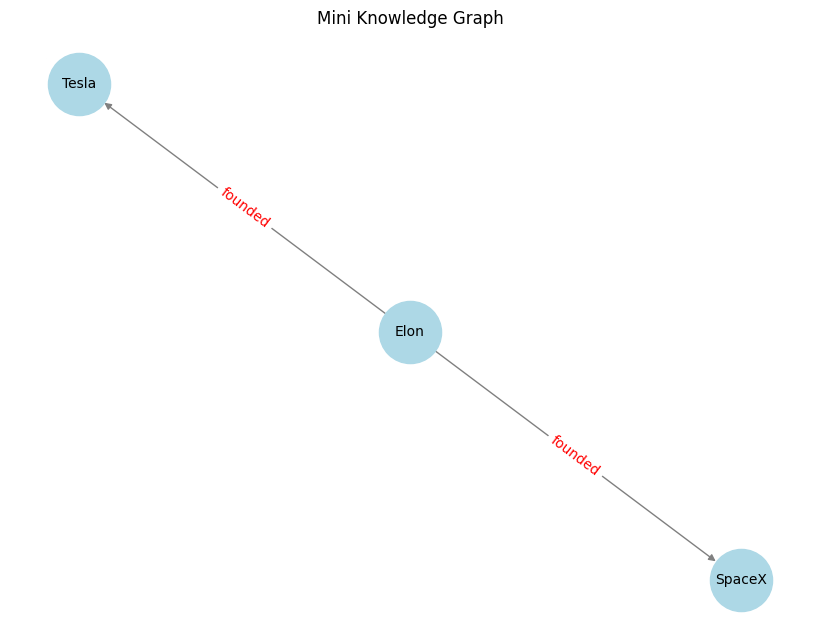

In [15]:
import networkx as nx
import matplotlib.pyplot as plt
# Initialize a directed graph
kg = nx.DiGraph()

# Extract triples and build KG
for sentence in doc.sentences:
    subj = obj = verb = None

    for word in sentence.words:
        if word.deprel == 'nsubj':
            subj = word.text
            verb = sentence.words[word.head - 1].text
        elif word.deprel == 'obj':
            obj = word.text
        elif word.deprel == 'conj' and obj:
            # Also handle conjunction like Tesla as another object
            kg.add_edge(subj, word.text, label=verb)

    if subj and obj and verb:
        kg.add_edge(subj, obj, label=verb)

# Visualize the knowledge graph
plt.figure(figsize=(8, 6))
pos = nx.spring_layout(kg)
nx.draw(kg, pos, with_labels=True, node_color='lightblue', edge_color='gray', node_size=2000, font_size=10)
edge_labels = nx.get_edge_attributes(kg, 'label')
nx.draw_networkx_edge_labels(kg, pos, edge_labels=edge_labels, font_color='red')
plt.title("Mini Knowledge Graph")
plt.axis('off')
plt.show()

now doing for our pdf 

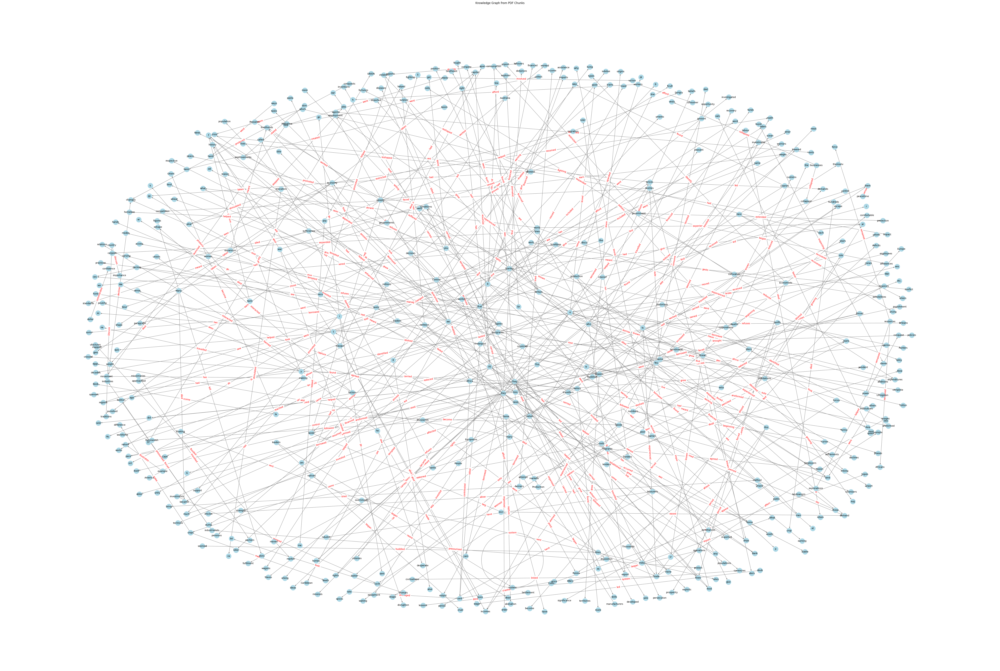

In [23]:
# Create directed graph
new = nx.DiGraph()

# Extract triples from each chunk
for chunk in chunks:
    doc = nlp(chunk)
    for sentence in doc.sentences:
        subj = obj = verb = None
        for word in sentence.words:
            if word.deprel == 'nsubj':
                subj = word.text
                verb = sentence.words[word.head - 1].text  # Get the verb
            elif word.deprel == 'obj':
                obj = word.text
            elif word.deprel == 'conj' and obj and subj and verb:
                new.add_edge(subj, word.text, label=verb)
        if subj and obj and verb:
            new.add_edge(subj, obj, label=verb)

# Visualize
plt.figure(figsize=(60, 40))
pos = nx.spring_layout(new, k=0.5)
nx.draw(new, pos, with_labels=True, node_color='lightblue', edge_color='gray', node_size=500, font_size=10)
edge_labels = nx.get_edge_attributes(new, 'label')
nx.draw_networkx_edge_labels(new, pos, edge_labels=edge_labels, font_color='red')
plt.title("Knowledge Graph from PDF Chunks")
plt.axis('off')
plt.show()


In [29]:

# Create a smaller graph
mini_kg = nx.DiGraph()

# Loop through chunks from PDF
for chunk in chunks:
    doc = nlp(chunk)

    for sentence in doc.sentences:
        subj = obj = verb = None

        for word in sentence.words:
            if word.deprel == 'nsubj':
                subj = word.text
                verb_idx = word.head - 1
                if 0 <= verb_idx < len(sentence.words):
                    verb = sentence.words[verb_idx].text
            elif word.deprel == 'obj':
                obj = word.text

        # Only add ONE main triple per sentence
        if subj and obj and verb:
            mini_kg.add_edge(subj, obj, label=verb)


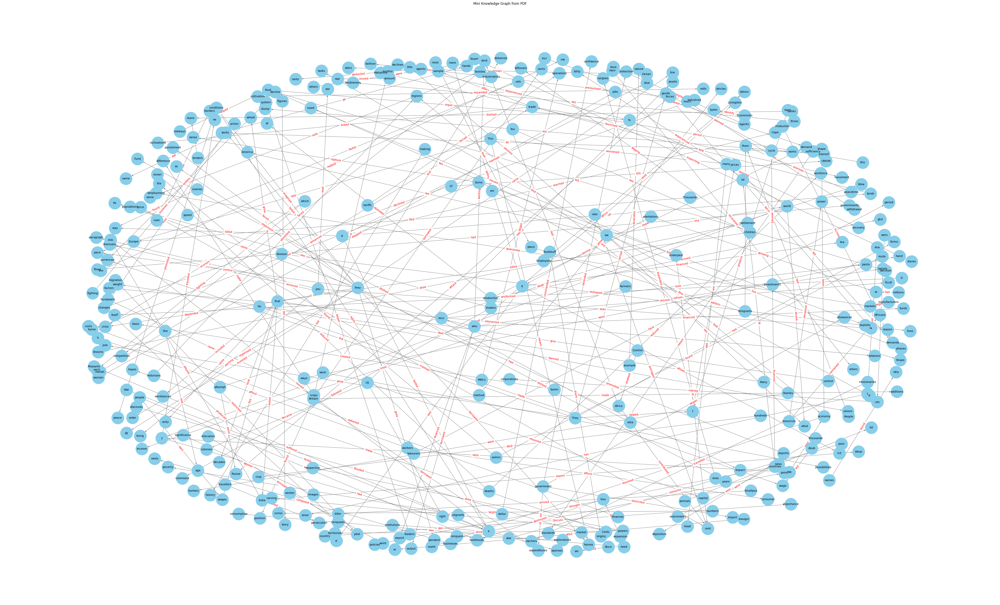

In [31]:
# Visualize
plt.figure(figsize=(50, 30))
pos = nx.spring_layout(mini_kg, k=0.7)
edge_labels = nx.get_edge_attributes(mini_kg, 'label')

nx.draw(mini_kg, pos, with_labels=True, node_color="skyblue", node_size=2000, font_size=10, edge_color="gray")
nx.draw_networkx_edge_labels(mini_kg, pos, edge_labels=edge_labels, font_color="red")
plt.title("Mini Knowledge Graph from PDF")
plt.show()


